In [35]:
import pandas as pd
import os

In [36]:
path = os.getcwd()

# load ad data (output from subregion.ipynb)
ads_df = pd.read_excel(f"{path}/intermediate/ads_data_final.xlsx")

ads_df.drop(columns=['Unnamed: 0'], inplace=True)
ads_df

,p_date,ad_id,delivery_country,queue_market,punish_num,latest_punish_begin_date,ad_revenue,avg_ad_revenue,start_time,baseline_st,product_line,task_type_en,punish_after_start_time,final_score,Subregion
0,20230807,1747578422390810,US,USCA,1,2023-07-24,71.639165,69.247744,2022-10-24 14:36:00.000000,1.78,Auction Ads,auction_relation,272,1.000000,Northern America
1,20230807,1758543228094480,SA,MENA,1,2023-06-14,44.455033,32.615441,2023-02-22 15:50:00.000000,1.67,RIE,Ad Group Recall (Merged),111,0.954532,Western Asia
2,20230807,1738303151826990,AU,AU,2,2023-07-24,1.317384,2.316247,2022-07-14 05:00:00.000000,1.84,Auction Ads,auction_relation,374,1.000000,Australia and New Zealand
3,20230807,1738303920938010,NZ,NZ,2,2023-07-24,3.496730,2.316247,2022-07-14 05:16:00.000000,1.58,Auction Ads,auction_relation,374,0.910277,Australia and New Zealand
4,20230807,1738304016410620,NZ,NZ,2,2023-07-24,1.234909,2.316247,2022-07-14 05:17:00.000000,1.58,Auction Ads,auction_relation,374,0.910277,Australia and New Zealand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40674,20230807,1773472206047230,VN,NaN,0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,South-eastern Asia
40675,20230807,1773607712030720,BR,NaN,0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Latin America and the Caribbean
40676,20230807,1773589699308540,BE,NaN,0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Western Europe
40677,20230807,1773530511220730,TR,NaN,0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Western Asia


### Data Cleaning

In [37]:
# clean market col in moderators data
def clean_moderators(df):
    all_mkts = []

    for i in range(len(df["market"])):
        l = df["market"].iloc[i]
        temp = l.split('"')

        new = []
        for each in temp:
            if "[" not in each and "]" not in each and "," not in each:
                new.append(each)

                if each not in all_mkts:
                    all_mkts.append(each)
        
        df.at[i, "market"] = new
    
    return df

In [38]:
# clean queue market col in ads data
def clean_ads(ads_df):
    # filling NaN values in queue market with the delivery mkt instead
    reclean_queueMkt = []

    for i in range(len(ads_df['queue_market'])):
        qMkt = ads_df['queue_market'].iloc[i]
        
        if ads_df['queue_market'].iloc[i] is None:
            reclean_queueMkt.append([ads_df['delivery_country'].iloc[i]])

        elif ads_df['queue_market'].iloc[i] == "Others":
            reclean_queueMkt.append(["Other"])
        
        elif ads_df['queue_market'].iloc[i] == "Other":
            reclean_queueMkt.append(["Other"])
        
        elif type(ads_df['queue_market'].iloc[i]) is float:
            reclean_queueMkt.append([ads_df['delivery_country'].iloc[i]])
            
        elif ads_df['queue_market'].iloc[i] == '':
            reclean_queueMkt.append([ads_df['delivery_country'].iloc[i]])

        # creates list 
        elif len(ads_df['queue_market'].iloc[i]) > 2:
            
            if 'USCA' in qMkt:
                x = ['US','CA']
                reclean_queueMkt.append(x)
            
            elif  'US&CA' in qMkt:
                x = ['US','CA']
                reclean_queueMkt.append(x)

            elif 'KW/AE/SA' in qMkt:
                x = ['KW','AE','SA']
                reclean_queueMkt.append(x)

            elif 'MENA' in qMkt:
                reclean_queueMkt.append([ads_df['delivery_country'].iloc[i]])
            
            else:
                x = [qMkt]
                reclean_queueMkt.append(x)

        else:
            x = [qMkt]
            reclean_queueMkt.append(x)
                
    ads_df['queue_market'] = reclean_queueMkt

    return ads_df

In [39]:
ads_df = clean_ads(ads_df)
ads_df

,p_date,ad_id,delivery_country,queue_market,punish_num,latest_punish_begin_date,ad_revenue,avg_ad_revenue,start_time,baseline_st,product_line,task_type_en,punish_after_start_time,final_score,Subregion
0,20230807,1747578422390810,US,"[US, CA]",1,2023-07-24,71.639165,69.247744,2022-10-24 14:36:00.000000,1.78,Auction Ads,auction_relation,272,1.000000,Northern America
1,20230807,1758543228094480,SA,[SA],1,2023-06-14,44.455033,32.615441,2023-02-22 15:50:00.000000,1.67,RIE,Ad Group Recall (Merged),111,0.954532,Western Asia
2,20230807,1738303151826990,AU,[AU],2,2023-07-24,1.317384,2.316247,2022-07-14 05:00:00.000000,1.84,Auction Ads,auction_relation,374,1.000000,Australia and New Zealand
3,20230807,1738303920938010,NZ,[NZ],2,2023-07-24,3.496730,2.316247,2022-07-14 05:16:00.000000,1.58,Auction Ads,auction_relation,374,0.910277,Australia and New Zealand
4,20230807,1738304016410620,NZ,[NZ],2,2023-07-24,1.234909,2.316247,2022-07-14 05:17:00.000000,1.58,Auction Ads,auction_relation,374,0.910277,Australia and New Zealand
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40674,20230807,1773472206047230,VN,[VN],0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,South-eastern Asia
40675,20230807,1773607712030720,BR,[BR],0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Latin America and the Caribbean
40676,20230807,1773589699308540,BE,[BE],0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Western Europe
40677,20230807,1773530511220730,TR,[TR],0,2000-01-01,0.541911,0.000000,2023-09-09 01:03:52.768014,0.54,Non-Auction Ads,Promote,0,0.038808,Western Asia


In [40]:
import math

# Load the Excel file into a dictionary of dataframes
excel_file = pd.ExcelFile('intermediate/mods_data_final.xlsx')  # Replace with your Excel file's path

# Initialize an empty dictionary to store dataframes
mkt_dict = {}

# Iterate through each sheet in the Excel file
for sheet_name in excel_file.sheet_names:
    if sheet_name != "Sheet1":
        # Read the sheet into a dataframe
        sheet_data = excel_file.parse(sheet_name)
        sheet_data = clean_moderators(sheet_data)
        
        sheet_data.drop(columns=['Unnamed: 0'], inplace=True)
        sheet_data["max_ads"] = sheet_data["productivity"]*sheet_data["utilisation"]
        sheet_data["max_ads"] = [math.floor(x) for x in sheet_data["max_ads"]]
        sheet_data["no_of_ads"] = 0
        
        # Store the dataframe in the dictionary with the sheet name as the key
        mkt_dict[sheet_name] = sheet_data

mkt_dict["Western Asia"]

,moderator,market,productivity,utilisation,handling_time,accuracy,ad_capacity,final_score,Subregion,max_ads,no_of_ads
0,9020538,"[PL, PT, GB, IL]",125.290000,0.000000,30487,0.250,0.000000,0.437888,"Eastern Europe, Southern Europe, Northern Euro...",0,0
1,2258595,"[SA, OM, BH, QA, AE, DZ, JO, IQ, KW, TN, MA, L...",0.000000,0.000000,0,0.333,0.000000,0.590884,"Western Asia, Northern Africa",0,0
2,1749551102734338,"[SA, OM, BH, QA, JO, IQ, KW, MA, LB, EG]",394.541395,0.751938,114562,0.404,296.670661,0.957081,"Western Asia, Northern Africa",296,0
3,7363167,"[SA, BH, OM, QA, AE, JO, IQ, KW, MA, EG]",254.820000,0.540042,2578531,0.500,137.613418,0.596623,"Western Asia, Northern Africa",137,0
4,3500723,"[SA, OM, QA, AE, TR, PK, KW, MA, EG, LB]",0.000000,0.000000,0,0.608,0.000000,0.531551,"Western Asia, Southern Asia, Northern Africa",0,0
...,...,...,...,...,...,...,...,...,...,...,...
116,1746474353707041,"[SA, BH, OM, QA, JO, IQ, KW, MA, LB, EG]",531.680000,0.750000,67500,1.000,398.760000,0.748375,"Western Asia, Northern Africa",398,0
117,1686044707253249,[TR],297.790000,0.855729,96808,1.000,254.827589,0.725470,Western Asia,254,0
118,1668385955785733,"[SA, ME]",298.673778,0.815556,125421,1.000,243.585059,0.708402,"Western Asia, Southern Europe",243,0
119,1689841547143170,"[SA, OM, BH, QA, JO, IQ, KW, EG, LB]",286.217674,0.812403,123549,0.000,232.524126,0.319007,"Western Asia, Northern Africa",232,0


In [41]:
# get best match between ad and moderator across all mkt segment
def get_ad_moderator_match(ad_id, ad_score, del_country, subregion, mkt_dict):

    mkt_df = mkt_dict[subregion]
    # get best match between ad and moderator
    moderator, m_score, scores_diff = get_best_match(ad_score, mkt_df, del_country)
    mkt = subregion

    # if max_ads = productivity * utilisation is larger than 0 -> moderator still has capacity to review ads
    if int(mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"]) > 0:
        # deduct 1 from max_ads
        mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"] -= 1
    # if max_ads = 0 is -> max_capacity is hit 
    else:
        # check how many ads the moderator reviewed past the capacity
        mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "no_of_ads"] += 1
    
    mismatch = abs(ad_score - m_score)

    #  add to output df
    new_row = {
        "ad_id": ad_id,
        "moderator_id": moderator,
        "ad_score": ad_score,
        "moderator_score": m_score,
        "mismatch_score": mismatch
    }

    return new_row, mkt_dict


# get match between ad and moderator in the mkt segment
def get_best_match(ad_score, mkt_df, del_country):

    # assume each extra ad reviewed past the capacity adds 1/(total no. of ads) to each score difference
    step = (1/40679)
    
    scores_diff = 1
    m_score = 0
    moderator = ""

    # loop through each subregion df
    for i in range(len(mkt_df["final_score"])):
        # get final score
        score = mkt_df["final_score"].iloc[i]
        # get mkt
        mkt_l = mkt_df["market"].iloc[i]

        # check if ad queue market(s) is in moderator markets
        check = False
        if del_country in mkt_l:
            check = True
        
        # get mismatch score
        diff = abs(ad_score - score)
        
        # if ad_capacity is not hit
        if mkt_df["max_ads"].iloc[i] > 0:
            diff = abs(ad_score - score)

            # check if it is the current lowest score mismatch
            if check and diff < scores_diff:
                scores_diff = diff
                moderator = mkt_df["moderator"].iloc[i]
                m_score = score

        # if ad_capacity is hit
        else:
            # penalise score with step
            diff = abs(ad_score - score) + step*mkt_df["no_of_ads"].iloc[i]

            # check if it is the current lowest score mismatch
            if check and diff < scores_diff:
                scores_diff = diff
                moderator = mkt_df["moderator"].iloc[i]
                m_score = score

    if moderator == "":
        raise ValueError("No matching moderator found.")
    
    return moderator, m_score, scores_diff

In [42]:
# initialise output list
output = []

# loop through each ad
for i in range(len(ads_df["final_score"])):

    ad_id = ads_df["ad_id"].iloc[i]
    ad_score = ads_df["final_score"].iloc[i]
    del_country = ads_df["delivery_country"].iloc[i]
    subregion = ads_df["Subregion"].iloc[i]

    result, new_mkt_dict = get_ad_moderator_match(ad_id, ad_score, del_country, subregion, mkt_dict)
    mkt_dict = new_mkt_dict
    output.append(result)

# result df with ad id and score, moderator id and score and mismatch score
mapping_df = pd.DataFrame(output)
mapping_df

/var/folders/n5/nyw3dq1s69nd91ynn_2b589r0000gn/T/ipykernel_4463/3411601056.py:10: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if int(mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"]) > 0:
/var/folders/n5/nyw3dq1s69nd91ynn_2b589r0000gn/T/ipykernel_4463/3411601056.py:10: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if int(mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"]) > 0:
/var/folders/n5/nyw3dq1s69nd91ynn_2b589r0000gn/T/ipykernel_4463/3411601056.py:10: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if int(mkt_dict[mkt].loc[mkt_dict[mkt]["moderator"] == moderator, "max_ads"]) > 0:
/var/folders/n5/nyw3dq1s69nd91ynn_2b589r0000gn/T/ipykernel_4463/3411601056.py:10: 

,ad_id,moderator_id,ad_score,moderator_score,mismatch_score
0,1747578422390810,3371590,1.000000,1.000000,0.000000
1,1758543228094480,1673359233746949,0.954532,0.955578,0.001046
2,1738303151826990,5090932,1.000000,0.872107,0.127893
3,1738303920938010,5090932,0.910277,0.872107,0.038170
4,1738304016410620,5090932,0.910277,0.872107,0.038170
...,...,...,...,...,...
40674,1773472206047230,7775518,0.038808,0.478714,0.439906
40675,1773607712030720,1005827,0.038808,0.108530,0.069722
40676,1773589699308540,5683738,0.038808,0.468604,0.429796
40677,1773530511220730,3778633,0.038808,0.109581,0.070773


In [43]:
# number of unique moderators
mapping_df["moderator_id"].nunique()

413

In [44]:
# average mismatch score
mapping_df["mismatch_score"].mean()

0.16096444975655247

<Axes: >

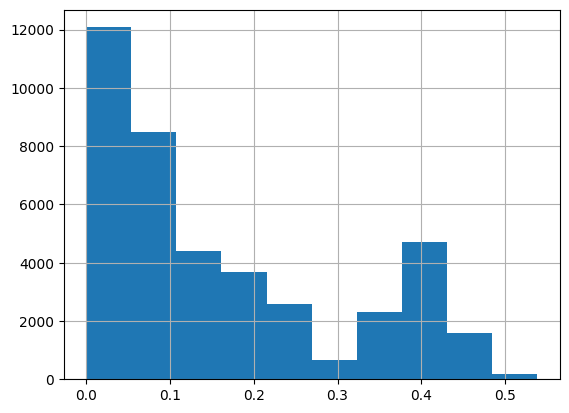

In [45]:
# mismatch score distribution
mapping_df["mismatch_score"].hist()

In [46]:
# output final scores to csv
mapping_df.to_csv('output/output.csv', index=False)